# Implementation of the article - StyleGAN-NADA: CLIP-Guided Domain Adaptation of Image Generators. Validation notebook

Метод StyleGAN-NADA использует CLIP для выравнивания исходных и целевых доменов в пространстве CLIP. Он оптимизирует синтезирующую сеть целевого домена с использованием функции потерь направления между изображениями
и текстовыми описаниями.

В этом ноутбуке демонстрируется генерация пяти обученных моделей по пропмптам:
 - Anime from face
 - Shrek from face
 - Zoombie from face
 - Sketch from face
 - Pixar cartoon from face

## Install additional modules and import python libs

In [2]:
# Установка необходимых библиотек
import os
os.environ['TORCH_CUDA_ARCH_LIST'] = '7.5'

# Установка зависимостей
!pip install ftfy tqdm gdown Ninja

# Импорт нужных библиотек
import torch
import numpy as np
import matplotlib.pyplot as plt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.8/422.8 kB 25.7 MB/s eta 0:00:00


In [3]:
# Будем работать с конкретным сидом
torch.manual_seed(345)

## Clone StyleGAN2 for pytorch from rosinality and original model weights

In [4]:
# Clone StyleGAN2 model from rosinality repository

# official stylegan2-pytorch
!git clone https://github.com/rosinality/stylegan2-pytorch.git

# загрузка адаптированного OneshotCLIP чекпоинта stylegan2-ffhq One-Shot Adaptation of GAN in Just One CLIP (в формате pytorch)
# checkpoint original
!wget https://huggingface.co/akhaliq/OneshotCLIP-stylegan2-ffhq/resolve/main/stylegan2-ffhq-config-f.pt -O stylegan2-ffhq-config-f.pt

%cd stylegan2-pytorch

Cloning into 'stylegan2-pytorch'...
remote: Enumerating objects: 395, done.
remote: Total 395 (delta 0), reused 0 (delta 0), pack-reused 395 (from 1)
Receiving objects: 100% (395/395), 122.51 MiB | 21.90 MiB/s, done.
Resolving deltas: 100% (203/203), done.
--2025-07-13 08:30:07--  https://huggingface.co/akhaliq/OneshotCLIP-stylegan2-ffhq/resolve/main/stylegan2-ffhq-config-f.pt
Resolving huggingface.co (huggingface.co)... 3.167.112.45, 3.167.112.38, 3.167.112.25, ...
Connecting to huggingface.co (huggingface.co)|3.167.112.45|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs.hf.co/repos/e9/a3/e9a3ec3ca794fe184757f39017bb3836044f5de0c2ff76d7109137c040c4b817/bae494ef77e32a9cd1792a81a3c167692a0e64f6bcd8b06592ff42917e2ed46e?response-content-disposition=inline%3B+filename*%3DUTF-8%27%27stylegan2-ffhq-config-f.pt%3B+filename%3D%22stylegan2-ffhq-config-f.pt%22%3B&Expires=1752399008&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQV

In [5]:
# StyleGAN2 model import
from model import Generator

No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'


## Key Params

In [6]:
# Key params

image_size = 1024
latent_dim = 512
batch_size = 2
LATENT_COUNT = 2 # сколько будем обрабатывать векторов
device = "cuda" if torch.cuda.is_available() else "cpu"

## Image output tools

In [7]:
# Images output tools

def print_image_orig_target(img_gen, img_target):
    # Предобработка
    img_gen = (img_gen.clamp(-1,1) + 1)/2
    img_gen = (img_gen * 255).permute(1,2,0).numpy().astype(np.uint8)

    img_target = (img_target.clamp(-1,1) + 1)/2
    img_target = (img_target * 255).permute(1,2,0).numpy().astype(np.uint8)

    # Визуализация
    fig, axs = plt.subplots(1, 2, figsize=(16, 32))  # Создание подграфиков для визуализации

    # Визуализация сгенерированного изображения
    # axs[0].imshow((img_gen.cpu().detach()[0].clip(-1,1).permute(1, 2, 0) + 1) / 2)
    axs[0].imshow(img_gen)
    axs[0].set_title("Сгенерированное изображение")  # Заголовок для сгенерированного изображения
    axs[0].axis('off')  # Отключение осей

    # Визуализация целевого изображения
    # axs[1].imshow((img_target.cpu().detach()[0].clip(-1,1).permute(1, 2, 0) + 1) / 2)
    axs[1].imshow(img_target)
    axs[1].set_title("Целевое изображение")  # Заголовок для целевого изображения
    axs[1].axis('off')  # Отключение осей
    plt.show()

## Load checkpoints fomr Google Drive

In [8]:
# Collected to gDrive final checkpoints
# https://drive.google.com/drive/folders/1a27Qx_Te2DQ95gjUhUEUW6K6VmFvcc4F?usp=drive_link

folder_id = "1a27Qx_Te2DQ95gjUhUEUW6K6VmFvcc4F"  # Замените на ваш ID
!gdown --folder "https://drive.google.com/drive/folders/{folder_id}" -O /content/checkpoints


Retrieving folder contents
Processing file 191H9mZYlBfwkYvg4O-o4SiqmmEiwG9nh 04_pixar_10l_300s_stylegan2_nada_final.pt
Processing file 16NWH0TmXbTzeYyZWjDTdtSj1R_GuFvmd 05_sketch_10l_300s_stylegan2_nada_final.pt
Processing file 1O7e8KjNWbT6WyoroA1ZydtM3YnCn-RTx 02_anime_10l_300s_stylegan2_nada_final.pt
Processing file 1AiyPwzD1Y5IFVnf-7l2clRrqYPSMqDRN 03_shrek_3l_150s_stylegan2_nada_final.pt
Processing file 183iiQC4aqBPUyfkGEdNp25U5F_RkvAZc 06_zoombie_5l_300s_stylegan2_nada_final.pt
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From (original): https://drive.google.com/uc?id=191H9mZYlBfwkYvg4O-o4SiqmmEiwG9nh
From (redirected): https://drive.google.com/uc?id=191H9mZYlBfwkYvg4O-o4SiqmmEiwG9nh&confirm=t&uuid=d7640e72-1fac-4832-89e9-842135a852cc
To: /content/checkpoints/04_pixar_10l_300s_stylegan2_nada_final.pt
100% 133M/133M [00:01<00:00, 115MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=16NWH0

## Show generated images, based on model checkpoints

Prompt: Anime from face


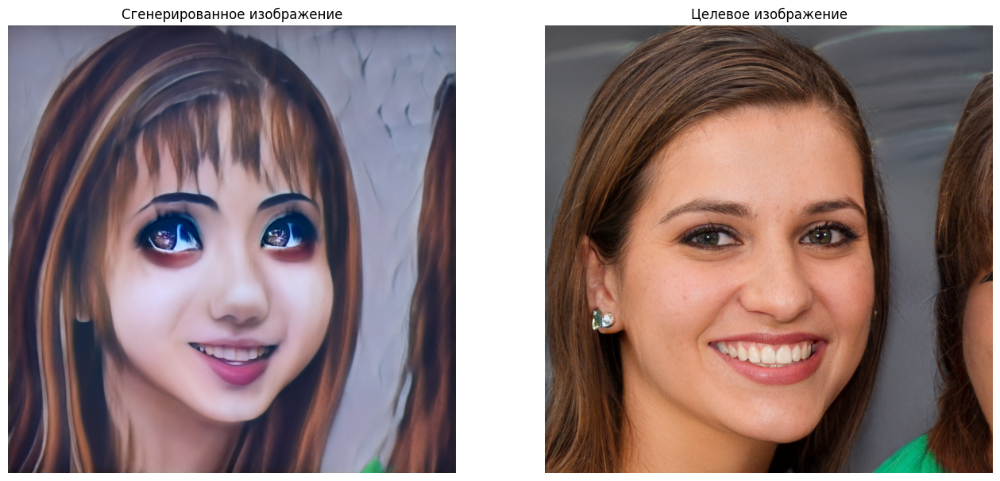

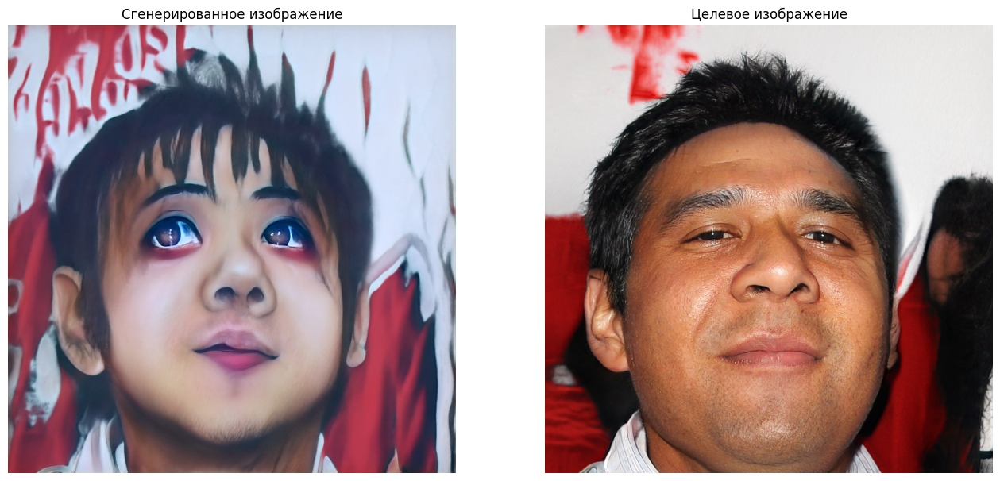

Prompt: Shrek from face


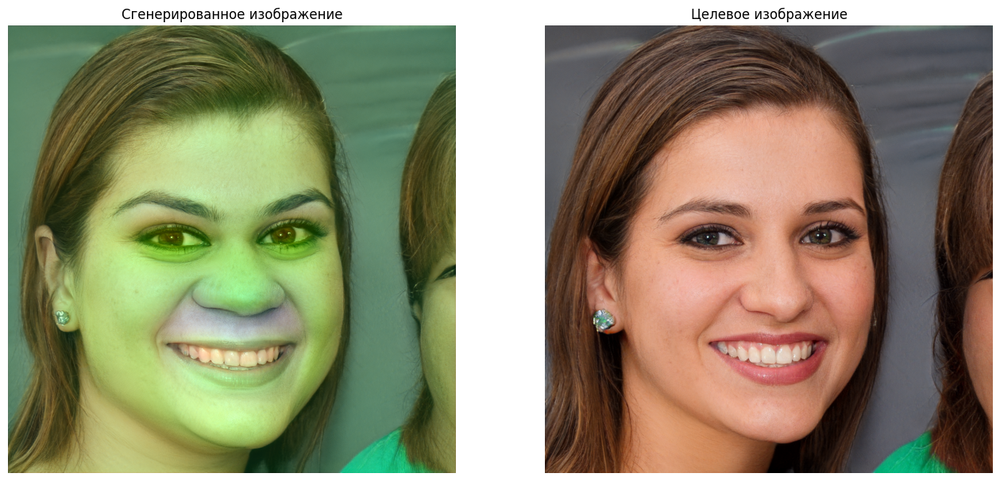

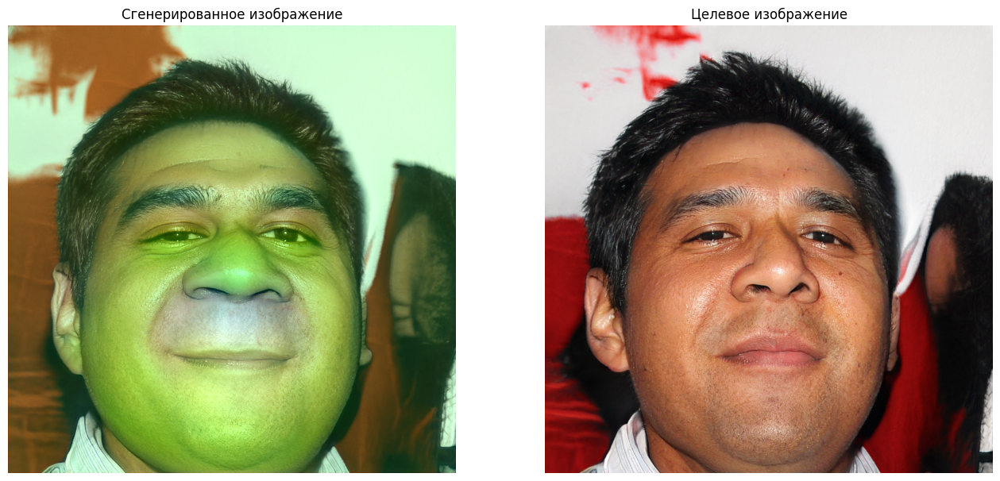

Prompt: Zoombie from face


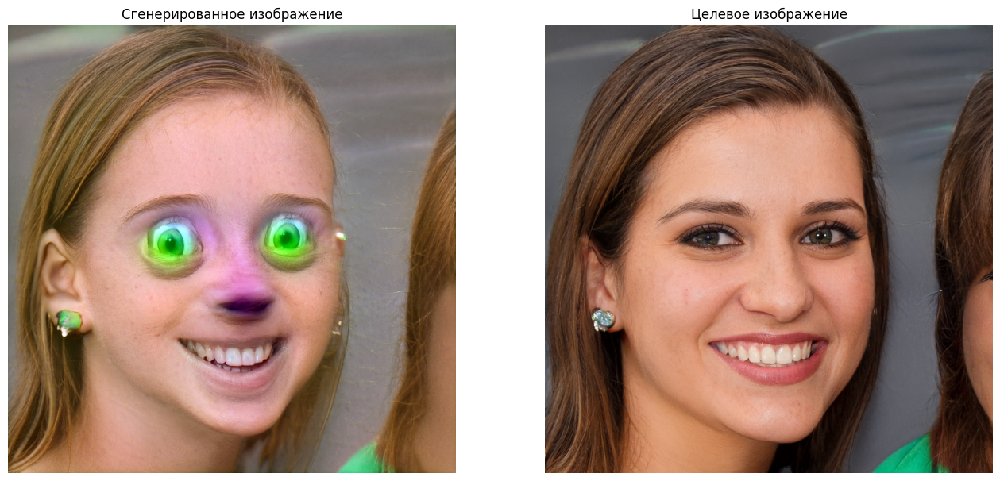

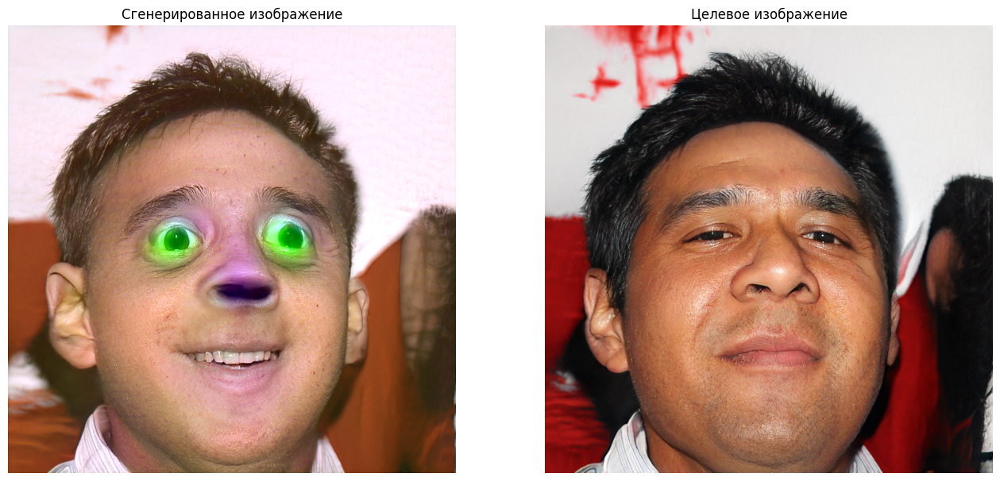

Prompt: Sketch from face


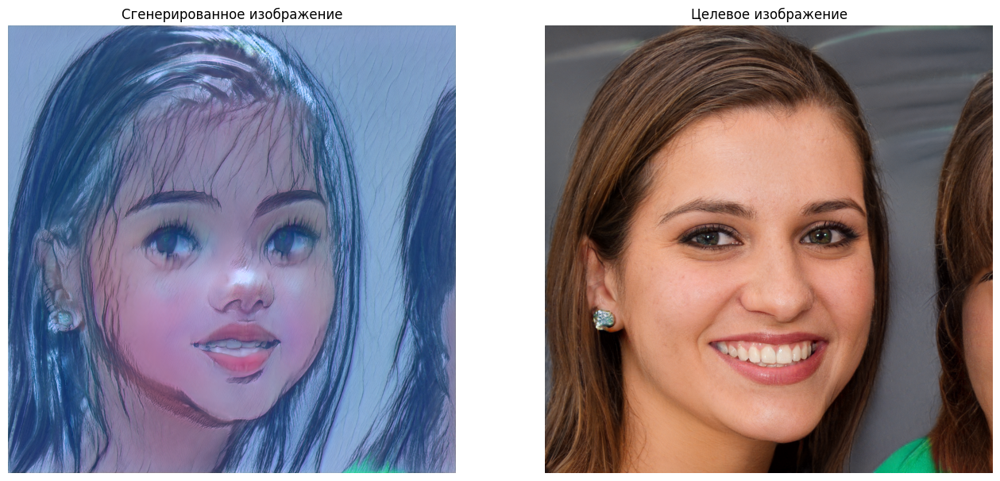

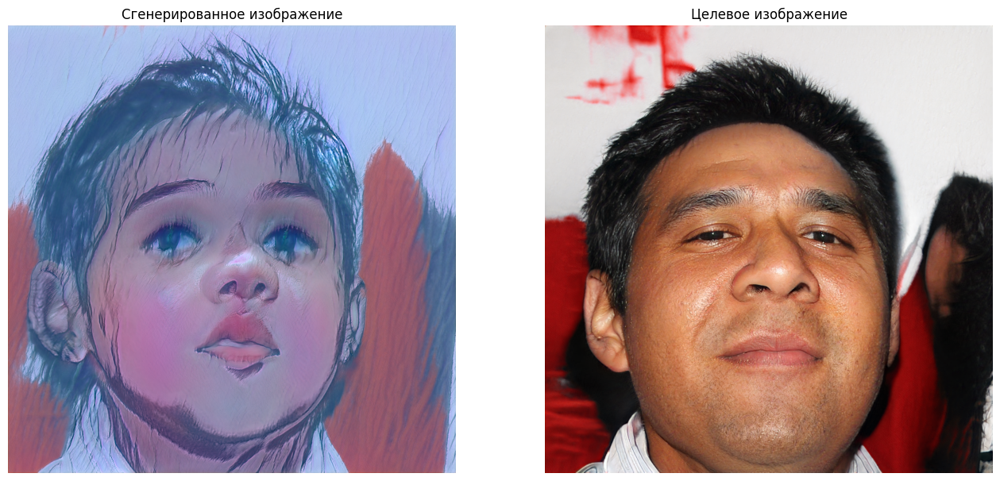

Prompt: Pixar cartoon from face


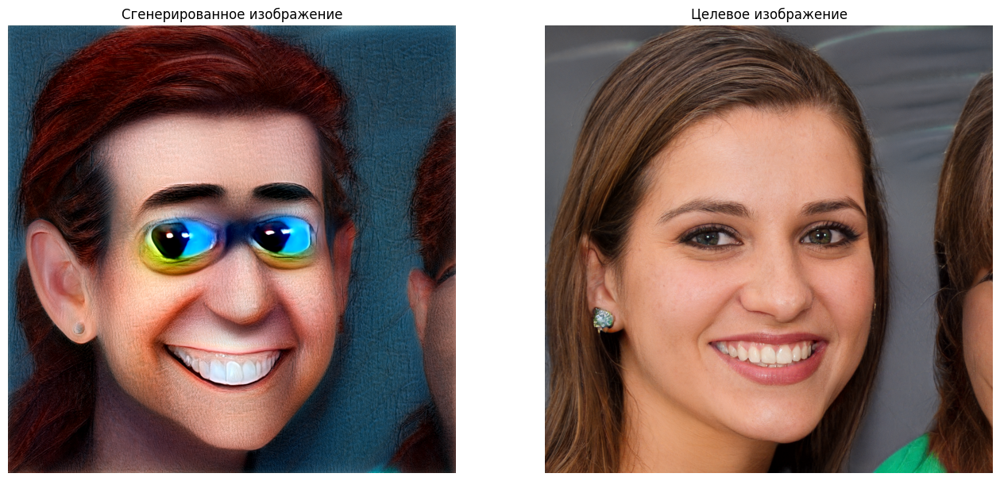

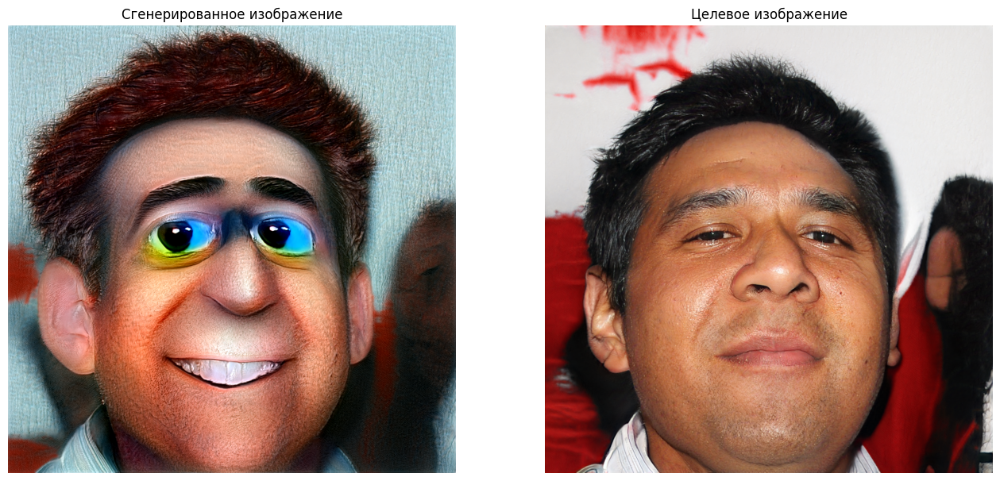

In [9]:
# Выводим LATENT_СOUNT изображений на основе LATENT_СOUNT случайных векторов
z = torch.randn(LATENT_COUNT, latent_dim, device=device)

stylegan2_orig_checkpoint_path = "/content/stylegan2-ffhq-config-f.pt"
# загружаем веса исходного генератора
generator_orig = Generator(
    size=image_size,
    style_dim=latent_dim,
    n_mlp=8,
    channel_multiplier=2
).to(device)

checkpoint_orig = torch.load(stylegan2_orig_checkpoint_path, map_location=device)
generator_orig.load_state_dict(checkpoint_orig["g_ema"])
generator_orig.eval()

# генератор для работы с обученными по промптам моделями
generator_final = Generator(
    size=image_size,
    style_dim=latent_dim,
    n_mlp=8,
    channel_multiplier=2
).to(device)

# список промптов файлов с чекпоинтами
checkpoint_files = [
    {"name": "Anime from face", "path": "/content/checkpoints/02_anime_10l_300s_stylegan2_nada_final.pt"},
    {"name": "Shrek from face", "path": "/content/checkpoints/03_shrek_3l_150s_stylegan2_nada_final.pt"},
    {"name": "Zoombie from face", "path": "/content/checkpoints/06_zoombie_5l_300s_stylegan2_nada_final.pt"},
    {"name": "Sketch from face", "path": "/content/checkpoints/05_sketch_10l_300s_stylegan2_nada_final.pt"},
    {"name": "Pixar cartoon from face", "path": "/content/checkpoints/04_pixar_10l_300s_stylegan2_nada_final.pt"}
]

# загрузка весов в генератор и вывод изображений
for cp_file in checkpoint_files:
    print(f"Prompt: {cp_file['name']}")
    stylegan2_final_checkpoint_path = cp_file['path']
    checkpoint_final = torch.load(stylegan2_final_checkpoint_path, map_location=device)
    generator_final.load_state_dict(checkpoint_final["g_ema"])
    generator_final.eval()

    with torch.no_grad():
        for i in range(LATENT_COUNT):

            target_imgs, _ = generator_orig([z], truncation=1, input_is_latent=False)
            fixed_imgs, _ = generator_final([z], truncation=1, input_is_latent=False)

            print_image_orig_target(fixed_imgs[i].cpu(), target_imgs[i].detach().cpu())
